## **Machine Learning for Poaching Risk Prediction in Kruger National Park**

#### Jupyter Notebook Demo: "What is Artificial Intelligence in the context of African Rhino Research"
Sandra MacFadyen

---

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/macSands/MachineLearning_Basics/blob/main/AfRSG_ML_example.ipynb)

---

### **How AI Can Help Rhino Protection in Africa**
Machine Learning (ML), a subset of **Artificial Intelligence (AI)**, offers powerful tools for **wildlife conservation** by:

- **Predicting Poaching Hotspots:** AI models analyze past incidents to identify **where poaching is most likely to occur**, allowing **proactive patrolling**.
- **Optimizing Ranger Deployment:** By focusing on **high-risk areas**, conservation teams can **allocate limited resources more effectively**.
- **Integrating Real-Time Data:** ML can process live data from **drones, camera traps, and satellites**, providing **early warnings of poaching threats**.
- **Enhancing Anti-Poaching Strategies:** AI can detect **patterns in poacher behavior**, helping authorities **stay ahead of illegal activities**.

By leveraging AI-driven models, conservationists can **improve rhino protection efforts** and combat poaching more efficiently, ensuring the survival of these endangered species in Africa.

---

### Machine Learning Workflow
This code demonstrates the basic building blocks of an AI-driven poaching risk pipeline for Kruger National Park:
It reads in a table of real poaching points (with longitude, latitude, and a label), then converts those points and a roads layer into a projected coordinate system (UTM 36S) so that distances can be measured in meters. It calculates each point’s minimum distance to the nearest road, then uses the reprojected DEM (elevation model) and slope raster to look up elevation and slope values for every point’s location. Finally, it stores these new columns—distance, elevation, slope—in a single GeoDataFrame and optionally transforms everything back to latitude–longitude (EPSG:4326) for sharing or display. The result is a unified dataset of poaching points enriched with roads‐distance, terrain height, and slope, ready for mapping or further modeling.

1. Data Simulation: Poaching incident points, non-incident points, roads.   
2. Feature Engineering: Distance to roads, slope (as a stand-in for terrain or habitat).   
3. Model Training: Random Forest classification.   
4. Grid Prediction: Generating a continuous surface of risk.   
5. Visualization: Static (matplotlib + contextily) and Interactive (folium).

In [ ]:
# !conda activate myenv
# !python --version

## 1. Installation and Imports
Make sure you have the necessary packages:


In [ ]:
# Ensure necessary packages are installed e.g. scikit-learn
# %pip uninstall scikit-learn
# %pip install scikit-learn
# %pip install contextily mapclassify rasterstats


Load the packages:

In [3]:
# Standard Library
import os  # Provides functions for interacting with the operating system (e.g., file handling, environment variables)

# Numerical and Data Handling Libraries
import numpy as np  # Supports large, multi-dimensional arrays and matrices, along with mathematical operations
import pandas as pd  # Data manipulation and analysis, particularly for tabular data

# Geospatial Data Handling
import geopandas as gpd  # Extends pandas to work with spatial/geographical data

# Visualization Libraries
import matplotlib.pyplot as plt  # Core visualization library for static, animated, and interactive plots
import matplotlib.colors as mcolors  # Utilities for working with color maps and color normalization

# Mapping Libraries
import contextily as ctx  # Adds basemaps to geospatial visualizations using tile providers (e.g., OpenStreetMap, Google)
import folium  # Enables the creation of interactive web maps based on Leaflet.js
import mapclassify  # Provides spatial classification schemes for choropleth mapping (e.g., quantiles, natural breaks)

# Machine Learning Imports
import sklearn  # Scikit-learn: a machine learning library for data mining and analysis
# Specific modules from scikit-learn:
from sklearn.ensemble import RandomForestClassifier  # Implements the Random Forest algorithm for classification tasks
from sklearn.model_selection import train_test_split  # Splits datasets into training and testing subsets
from sklearn.metrics import roc_curve, roc_auc_score, classification_report  
# roc_curve: Computes Receiver Operating Characteristic (ROC) curve
# roc_auc_score: Computes Area Under the ROC Curve (AUC)
# classification_report: Generates a detailed report of precision, recall, and F1-score for classification results
from sklearn.tree import plot_tree  # Plots decision trees from models like RandomForestClassifier

# Geometric and Spatial Data Handling (Shapely)
import shapely  # A library for geometric objects and spatial operations
# Specific geometric classes:
from shapely.geometry import Point, LineString, Polygon  
# Point: Represents a single (x, y) coordinate
# LineString: Represents a connected sequence of points (i.e., a line)
# Polygon: Represents a shape with an outer boundary and optional inner holes

# Raster Data Processing (Rasterio & Rasterstats)
import rasterio  # Library for reading, writing, and processing geospatial raster data
# Specific raster processing utilities:
from rasterio import features  # Extracts raster features (e.g., shapes, masks) 
from rasterio.warp import calculate_default_transform, reproject, Resampling  
# calculate_default_transform: Computes an optimal affine transformation for reprojecting rasters
# reproject: Reprojects raster data to a different coordinate reference system (CRS)
# Resampling: Defines methods for interpolating raster data (e.g., nearest neighbor, bilinear)

from rasterstats import point_query  # Queries raster values at given point locations

---

## 2. Define the Kruger Bounding Box
We use approximate bounds for Kruger in WGS 84 (EPSG:4326).

In [4]:
# Bounding box for Kruger (EPSG:4326)
x_min, y_min = 30.74, -25.65
x_max, y_max = 32.16, -22.22

# Create a shapely Polygon for the bounding box (in lon/lat order)
bbox_polygon = Polygon([
    (x_min, y_min),
    (x_min, y_max),
    (x_max, y_max),
    (x_max, y_min)
])


#### Visualizing a Bounding Box on a Folium Map

This code snippet creates an interactive map using the **Folium** library and overlays a bounding box as a polygon.

##### Calculate the Center of the Bounding Box:
   The center coordinates `(center_lat, center_lon)` are computed by averaging the minimum (`y_min`, `x_min`) and maximum (`y_max`, `x_max`) latitude and longitude values. This ensures the map is centered on the bounding box.

##### Initialize a Folium Map:  
   A `folium.Map` object is created with the calculated center coordinates and an initial zoom level of `8`.

##### Add a Polygon to Represent the Bounding Box:  
   The bounding box is drawn as a **polygon** using `folium.vector_layers.Polygon`.  
   - The **`locations`** parameter specifies the four corners of the bounding box in `[latitude, longitude]` format.
   - The polygon is styled with a **blue border (`color='blue'`)** and a **semi-transparent fill (`fill_opacity=0.2`)**.
   - A **popup label ("Kruger Bounding Box")** is added, which displays when the polygon is clicked.

##### Display the Map:  
   The polygon is added to the map, and `m` represents the final interactive Folium map.

This visualization is useful for defining spatial extents, analyzing geographic data, or highlighting specific areas on an interactive map.


In [5]:
# Calculate center of bounding box to initialize the map
center_lat = (y_min + y_max) / 2
center_lon = (x_min + x_max) / 2

# Create a Folium map centered on the bounding box
m = folium.Map(location=[center_lat, center_lon], zoom_start=8)

# Add a Folium polygon directly from coordinate pairs
# Remember to pass [lat, lon] to Folium
folium.vector_layers.Polygon(
    locations=[
        [y_min, x_min],
        [y_max, x_min],
        [y_max, x_max],
        [y_min, x_max]
    ],
    color='blue',
    weight=2,
    fill=True,
    fill_color='blue',
    fill_opacity=0.2,
    popup="Kruger Bounding Box"
).add_to(m)

# Display the map
m

---

## 3a. Generating Random Geographical Points for Poaching Incident Analysis

This function, `generate_random_points_in_bbox`, generates random geographical points within a **bounding box** and assigns each point relevant attributes, including whether it represents a **poaching incident** or a **non-incident**. The function is useful for simulating wildlife conservation data, analyzing spatial patterns of poaching, or training machine learning models.

##### **Function Breakdown**
1. **Parameters:**  
   - `n_points`: The number of random points to generate.  
   - `bbox_poly`: A **Shapely Polygon** representing the bounding box from which points will be sampled.  
2. **Extract Bounding Box Limits:**  
   - The function retrieves the **minimum (`minx, miny`) and maximum (`maxx, maxy`)** coordinates of the bounding box.  
3. **Generate Random Points and Attributes:**  
   - A loop iterates `n_points` times, generating:  
     - A **random (x, y) coordinate** within the bounding box.  
     - A **random `age`** (1 to 40 years) — representing the estimated age of an affected animal.  
     - A **random `weight`** (800 to 2500 kg) — possibly representing species weight distributions.  
     - A **random `rainfall`** value (10 to 300 mm) — indicating environmental conditions.  
     - A **binary label (`0` or `1`)**, where:  
       - `label = 1` represents a **poaching incident**.  
       - `label = 0` represents a **non-incident** (background data point).  
4. **Return a List of Tuples:**  
   - Each generated point is stored as a tuple: **(Shapely Point, age, weight, rainfall, label)**.  

This function provides a structured way to **simulate poaching incident data** within a defined spatial extent, which can later be converted into a **GeoDataFrame** for geospatial analysis or predictive modeling.


In [6]:
# This code generates random geographical points within a bounding box, labels them as 
# incidents or non-incidents, and combines them into a GeoDataFrame for possible further 
# analysis in a spatial context.
def generate_random_points_in_bbox(n_points, bbox_poly):
    """
    Generate n_points uniformly distributed within the bounding box of bbox_poly,
    along with random integer attributes:
      - age: 1 to 40 (inclusive)
      - weight: 800 to 2500 kg (inclusive)
      - rainfall: 10 to 300 mm (inclusive)
      - label: either 0 or 1
    """
    points = []
    minx, miny, maxx, maxy = bbox_poly.bounds

    for _ in range(n_points):
        # Generate a random point inside the bounding box.
        randx = np.random.uniform(minx, maxx)
        randy = np.random.uniform(miny, maxy)
        pt = Point(randx, randy)
        
        # Generate random integer attributes.
        age = np.random.randint(1, 41)         # 1 to 40 inclusive
        weight = np.random.randint(800, 2501)    # 800 to 2500 inclusive
        rainfall = np.random.randint(10, 301)    # 10 to 300 inclusive
        label = np.random.randint(0, 2)          # Either 0 or 1
        
        # Append as a tuple (Point, age, weight, rainfall, label).
        points.append((pt, age, weight, rainfall, label))
        
    return points


#### Creating a GeoDataFrame for Poaching Incident Analysis

This code **executes** the previously defined `generate_random_points_in_bbox` function to generate random spatial data and organizes it into a **GeoDataFrame** for further spatial analysis.

##### **Step-by-Step Breakdown**

1. **Generate Random Spatial Points:**
   - Calls `generate_random_points_in_bbox(400, bbox_polygon)`, which returns **400 points** within the bounding box along with their attributes.
2. **Store Data in a Pandas DataFrame:**
   - The generated list of tuples is converted into a **Pandas DataFrame (`poaching_df`)** with appropriate column names:
     - `"geometry"`: Spatial location (`Point`).
     - `"age"`, `"weight"`, `"rainfall"`: Environmental and biological attributes.
     - `"label"`: **1 for poaching incidents, 0 for non-incidents**.
3. **Convert to a GeoDataFrame:**
   - The **Pandas DataFrame** is converted into a **GeoPandas GeoDataFrame (`gdf_points`)**, allowing for geospatial operations.
   - `"geometry"` is set as the spatial column.
   - The **Coordinate Reference System (CRS) is set to EPSG:4326** (WGS 84).
4. **Inspect Data Structure:**
   - `print(gdf_points.head())` displays the first few records, confirming the structure and correctness of the dataset.

By running `generate_random_points_in_bbox`, this script creates a **spatial dataset** that can be used for further **mapping, analysis, or predictive modeling** of **poaching incidents**.


In [7]:
# Create 400 random poaching incidents
# Assume generate_random_points_in_bbox returns a list of tuples like:
# (Point, age, weight, rainfall, label)
points = generate_random_points_in_bbox(400, bbox_polygon)

# Create a DataFrame with appropriate column names
poaching_df = pd.DataFrame(points, columns=["geometry", "age", "weight", "rainfall", "label"])
# print("Check poaching_df:\n", poaching_df.head())

gdf_points = gpd.GeoDataFrame(poaching_df, geometry="geometry", crs="EPSG:4326")
print("Check gdf_points:\n", gdf_points.head())

Check gdf_points:
                      geometry  age  weight  rainfall  label
0  POINT (32.03756 -22.75491)   16    2338        91      1
1  POINT (32.04648 -24.13151)   29    1459       169      1
2  POINT (30.84441 -25.11734)   38     831        20      1
3  POINT (31.47798 -25.32791)   20     814       120      0
4  POINT (31.55389 -24.31064)   12    2113       177      0


#### Visualizing Simulated Poaching Incidents vs. Non-Incidents on a Map

This code **plots poaching incidents (orange) and non-incidents (green)** onto an interactive **Folium** map using the generated `gdf_points` dataset.

##### **Step-by-Step Breakdown**

1. **Iterate Over Each Point in `gdf_points`:**
   - Extracts the **latitude (`lat`)** and **longitude (`lon`)** from the **Shapely Point geometry**.
2. **Assign Marker Colors Based on Labels:**
   - If `label == 1` (Poaching Incident), the marker is **orange** with a popup **"Poaching Incident"**.
   - If `label == 0` (Non-Incident), the marker is **green** with a popup **"Non-Incident"**.
3. **Plot Markers Using `folium.CircleMarker`:**
   - **Small circular markers (`radius=1`)** represent each location.
   - Markers are **color-coded**, filled, and have a slight transparency (`fill_opacity=0.6`).
   - Each marker includes a **popup label** indicating its classification.
4. **Display the Interactive Map (`m`):**
   - The updated Folium map with all plotted points is displayed.

This visualization helps analyze the **spatial distribution of poaching incidents** and identify patterns in relation to non-incidents.


In [8]:
# -------------------------------------------------------------------------
# 4. PLOT THE POACHING (ORANGE) VS. NON-POACHING (GREEN) POINTS
# -------------------------------------------------------------------------
for idx, row in gdf_points.iterrows():
    # row.geometry is a shapely Point: (lon, lat)
    lat = row.geometry.y
    lon = row.geometry.x
    
    if row['label'] == 1:
        marker_color = 'orange'
        popup_text = 'Poaching Incident'
    else:
        marker_color = 'green'
        popup_text = 'Non-Incident'
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=1,
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.6,
        popup=popup_text
    ).add_to(m)

# -------------------------------------------------------------------------
# 5. DISPLAY THE MAP
# -------------------------------------------------------------------------
m

---

## 3b. Loading and Converting Custom Poaching Incident Data

This code loads a **user-provided dataset** of poaching incidents, converts it into a **GeoDataFrame**, and prepares it for spatial analysis.

##### **Step-by-Step Breakdown**

1. **Load the CSV File (`my_poaching_points.csv`):**
   - Reads a dataset containing poaching-related points using `pd.read_csv()`.
   - Different datasets are available:
     - `"my_poaching_points.csv"`: **Completely random data**.
     - `"my_poaching_points_roads.csv"`: **Points within 4km of roads**, with older, heavier animals and higher rainfall.
     - `"my_poaching_points_knp.csv"`: **Points exactly along roads**.
2. **Create a Geometry Column (`geometry`):**
   - Converts longitude (`lon`) and latitude (`lat`) into **Shapely Point objects** using `gpd.points_from_xy()`.
   - Longitude (`lon`) represents the **x-coordinate**.
   - Latitude (`lat`) represents the **y-coordinate**.
3. **Convert to a GeoDataFrame (`my_gdf_points`):**
   - The **Pandas DataFrame** is transformed into a **GeoPandas GeoDataFrame** for spatial analysis.
   - `"geometry"` is set as the spatial column.
   - **Coordinate Reference System (CRS) is EPSG:4326** (WGS 84).
4. **Inspect the Data Structure:**
   - `print(my_gdf_points.head())` displays the first few rows to verify correct formatting.

By integrating **custom poaching data**, this workflow enables analysis of **spatial patterns**, correlations with environmental factors, and visualization of poaching incident hotspots.


In [ ]:
# 1. Read in your CSV or table of points
# Make sure your file has columns: id, long, lat, label
# LOCAL FILE VERSION
# my_df_points = pd.read_csv("data/my_poaching_points.csv") # Completely random
# my_df_points = pd.read_csv("data/my_poaching_points_roads.csv") # Linked to 4km from roads, older and heavier animals, and higher rainfall
# my_df_points = pd.read_csv("data/my_poaching_points_knp.csv") # Exactly along roads

# GITHUB FILE VERSION
url = "https://raw.githubusercontent.com/macSands/MachineLearning_Basics/main/data/my_poaching_points_roads.csv"
my_df_points = pd.read_csv(url)  # Linked to 4km from roads, older and heavier animals, and higher rainfall

# 2. Create a 'geometry' column from longitude & latitude
# Note that long = x-coordinate, lat = y-coordinate
my_df_points["geometry"] = gpd.points_from_xy(my_df_points["lon"], my_df_points["lat"])

# 3. Convert the DataFrame to a GeoDataFrame in EPSG:4326 (WGS84 lat/lon)
my_gdf_points = gpd.GeoDataFrame(
    my_df_points,
    geometry="geometry",
    crs="EPSG:4326"  # This matches the coordinate columns we read in
)

# 4. Inspect the first few rows
print("Check my_gdf_points:\n", my_gdf_points.head())


Check my_gdf_points:
    id        lon        lat  age  weight  rainfall  label  \
0   1  31.735191 -25.523675    3     300       137      0   
1   2  31.671623 -25.523289    9     900       149      0   
2   3  31.910382 -25.522085    1     100        45      0   
3   4  31.822994 -25.515798    3     300        28      0   
4   5  31.291215 -25.514799   10    1000       110      0   

                     geometry  
0  POINT (31.73519 -25.52368)  
1  POINT (31.67162 -25.52329)  
2  POINT (31.91038 -25.52209)  
3  POINT (31.82299 -25.51580)  
4  POINT (31.29121 -25.51480)  


#### Visualizing Imported Poaching Incidents vs. Non-Incidents on a Map

This code **plots poaching incidents (red) and non-incidents (blue)** onto an interactive **Folium** map using the generated `my_gdf_points` dataset.

In [10]:
# -------------------------------------------------------------------------
# 4. PLOT THE POACHING (RED) VS. NON-POACHING (BLUE) POINTS
# -------------------------------------------------------------------------
for idx, row in my_gdf_points.iterrows():
    # row.geometry is a shapely Point: (lon, lat)
    lat = row.geometry.y
    lon = row.geometry.x
    
    if row['label'] == 1:
        marker_color = 'red'
        popup_text = 'Poaching Incident'
    else:
        marker_color = 'blue'
        popup_text = 'Non-Incident'
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=1,
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.6,
        popup=popup_text
    ).add_to(m)

# -------------------------------------------------------------------------
# 5. DISPLAY THE MAP
# -------------------------------------------------------------------------
m

---

## 4. Loading and Preparing a Roads Layer for Spatial Analysis

This code loads a **roads dataset**, checks its structure, and ensures it is in the correct coordinate reference system (CRS) for spatial operations.

##### **Step-by-Step Breakdown**

1. **Load the Roads Dataset (`roads_public.shp` or `roads.geojson`):**
   - Reads a **shapefile (`.shp`)** or **GeoJSON (`.geojson`)** containing road data using `gpd.read_file()`.
   - Stores the data in a **GeoPandas GeoDataFrame (`gdf_roads`)**.
   - `print(gdf_roads.head())` displays the first few rows for inspection.
2. **Ensure the Roads Layer Uses WGS84 (EPSG:4326):**
   - **Check the current CRS** using `gdf_roads.crs`.
   - If the CRS is **not EPSG:4326** (WGS 84), **reproject the data** using `to_crs(epsg=4326)`.
   - This ensures compatibility with other spatial layers (e.g., poaching incident points) that also use WGS84.

With this **roads layer**, spatial analyses can examine relationships between **poaching incidents and road networks**, such as proximity analysis or hotspot mapping.


In [11]:
# -------------------------------------------------------------------------
# 1. LOAD YOUR ROADS LAYER
# -------------------------------------------------------------------------
# Load SHP using GeoPandas
# gdf_roads = gpd.read_file("roads_all.shp")  # or "roads.geojson"
gdf_roads = gpd.read_file("data/roads_public.shp")  # or "roads.geojson"
print("Check roads layer:\n", gdf_roads.head())

# Make sure the roads are in WGS84 (EPSG:4326). If not, reproject:
if gdf_roads.crs and gdf_roads.crs.to_epsg() != 4326:
    gdf_roads = gdf_roads.to_crs(epsg=4326)


Check roads layer:
    OBJECTID  ACCESS  CODE                       NAME          BOUNDARY  \
0       306  Public  None  Shingwedzi Rest Camp Road              None   
1       307  Public  None  Shingwedzi Rest Camp Road              None   
2       478  Public  S146         Stapelkop Dam Road              None   
3       506  Public  None             Giriuondo Road  Section Boundary   
4       509  Public  None             Giriuondo Road  Section Boundary   

            CLASS_DEFI SURFACE  LENGTH_KM                CLASS  length  \
0      Rest Camp Roads     Tar   0.252440      Rest Camp Roads       0   
1      Rest Camp Roads     Tar   0.184549      Rest Camp Roads       0   
2  Tourist Gravel Road  Gravel   3.323928  Tourist Gravel Road       0   
3  Tourist Gravel Road  Gravel   3.751431  Tourist Gravel Road       0   
4  Tourist Gravel Road  Gravel   1.193545  Tourist Gravel Road       0   

   width_m  bufferM                                           geometry  
0        5      2

#### Plotting the Roads Layer on an Interactive Map

This code **adds a roads layer** to the existing **Folium** map (`m`), allowing for visualization alongside poaching incidents.

##### **Step-by-Step Breakdown**

1. **Convert the Roads Layer to GeoJSON Format:**
   - Uses `gdf_roads.__geo_interface__` to convert the **GeoDataFrame** into a format compatible with **Folium**.
2. **Add the Roads Layer to the Map (`folium.GeoJson`):**
   - The `folium.GeoJson()` function plots the roads with the following styling:
     - **Color:** Black (`'color': 'black'`).
     - **Line weight:** 2 (`'weight': 2`), making roads visible but not overpowering other features.
3. **Display the Updated Map (`m`):**
   - The final map includes **both**:
     - **Poaching incidents (orange) and non-incidents (green).**
     - **Roads (black lines).**

By overlaying **road networks with poaching data**, this visualization can help explore **spatial relationships between poaching incidents and road access**, potentially revealing hotspots and accessibility-driven patterns.


In [12]:
# -------------------------------------------------------------------------
# 3. ADD THE ROADS AS A GEOJSON LAYER
# -------------------------------------------------------------------------
# style_function controls the line style (color, thickness, etc.)
folium.GeoJson(
    data=gdf_roads.__geo_interface__,
    name='Roads',
    style_function=lambda feature: {
        'color': 'black',
        'weight': 2
    }
).add_to(m)

# -------------------------------------------------------------------------
# 5. DISPLAY THE MAP
# -------------------------------------------------------------------------
m

---

## 5. Calculating Distance to Roads for Feature Engineering

This code computes the **distance of each poaching and non-poaching point to the nearest road**, a crucial feature for machine learning models analyzing spatial patterns in poaching incidents.

##### **Step-by-Step Breakdown**

1. **Reproject Data to a Local UTM Coordinate System:**
   - Converts both **poaching points (`my_gdf_points`)** and **roads (`gdf_roads`)** to **UTM Zone 36S (EPSG:32736)**.
   - UTM provides **meter-based distances**, ensuring accurate proximity calculations.
2. **Compute Distance to Nearest Road:**
   - Iterates through each **point** in the reprojected dataset.
   - Uses `gdf_roads_utm.distance(point).min()` to compute **the shortest distance** between the point and the road network.
   - Converts the distance from **meters to kilometers** (`/1000`).
   - Appends the computed distance to a new list (`distances`).
3. **Store Distance Values in the Dataset:**
   - A new column **`"dist_to_road"`** is added to `gdf_points_utm`, representing the **distance (in km) to the nearest road**.
4. **Inspect the Updated Dataset:**
   - `print(gdf_points_utm.head())` displays the first few rows to verify the new feature.

This newly engineered feature, **distance to roads**, can be critical in understanding how **accessibility affects poaching risk** and can improve the predictive power of machine learning models.


In [31]:
# Project to a local UTM (approx. UTM Zone 36S covers Kruger)
# gdf_points_utm = gdf_points.to_crs(epsg=32736)  # WGS84 / UTM zone 36S
gdf_points_utm = my_gdf_points.to_crs(epsg=32736) # WGS84 / UTM zone 36S
gdf_roads_utm = gdf_roads.to_crs(epsg=32736)

# Compute distance to roads
distances = []
for point in gdf_points_utm.geometry:
    # Distance to each road, take min
    dmin = gdf_roads_utm.distance(point).min()/1000
    distances.append(dmin)

gdf_points_utm["dist_to_road"] = distances
print("Check gdf_points_utm:\n", gdf_points_utm.head())

# Optional: Add a random "slope" or "elevation" value
# We'll just simulate it here
# gdf_points_utm["slope"] = np.random.normal(loc=10, scale=3, size=len(gdf_points_utm))


C:\Users\macfadyen\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\shapely\measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


Check gdf_points_utm:
    id        lon        lat  age  weight  rainfall  label  \
0   1  31.735191 -25.523675    3     300       137      0   
1   2  31.671623 -25.523289    9     900       149      0   
2   3  31.910382 -25.522085    1     100        45      0   
3   4  31.822994 -25.515798    3     300        28      0   
4   5  31.291215 -25.514799   10    1000       110      0   

                         geometry  dist_to_road  
0  POINT (372908.224 7176459.870)     15.532550  
1  POINT (366519.624 7176440.317)     14.337683  
2  POINT (390511.942 7176791.864)     17.588504  
3  POINT (381723.995 7177413.282)     17.505868  
4  POINT (328276.270 7176944.113)     17.478790  


---

## 6. Extracting Elevation and Slope for Feature Engineering

This code extracts **elevation and slope values** from raster datasets for each poaching/non-poaching point. These features provide crucial **topographical context**, which can improve machine learning models predicting poaching risk.

##### **Step-by-Step Breakdown**

1. **Extract Elevation from a Digital Elevation Model (DEM):**
   - Opens the **DEM raster (`dem_aoi_utm36S.tif`)** using `rasterio.open()`.
   - Converts the geometry of each point into **(x, y) coordinates**.
   - Uses `dem_src.sample(coords)` to **extract elevation values** for each point.
   - Stores extracted values in the **`"elevation"` column** of `gdf_points_utm`.
2. **Extract Slope from a Precomputed Slope Raster:**
   - Opens the **slope raster (`slope_sqrt_aoi_utm36S.tif`)**.
   - Repeats the coordinate extraction process.
   - Uses `slope_src.sample(coords)` to **extract slope values**.
   - Stores extracted values in the **`"slope"` column** of `gdf_points_utm`.
3. **(Optional) Convert Back to WGS84 for Further Operations:**
   - The dataset is reprojected back to **EPSG:4326 (WGS84)** using `.to_crs(epsg=4326)`.
   - This ensures compatibility with other geographic data that uses latitude/longitude coordinates.
4. **Inspect the Updated Dataset:**
   - `print(gdf_points_final.head())` displays the first few rows to confirm the addition of `"elevation"` and `"slope"` features.

By incorporating **elevation** and **slope** as predictive features, the model gains insights into **terrain-based influences on poaching activity**, such as whether incidents occur more frequently in **lowlands (accessible areas) or rugged terrain (secluded areas)**.


In [32]:
# 6a. Extract ELEVATION from DEM
with rasterio.open("data/dem_aoi_utm36S.tif") as dem_src:
    coords = [(geom.x, geom.y) for geom in gdf_points_utm.geometry]
    elev_vals = [val[0] for val in dem_src.sample(coords)]
gdf_points_utm["elevation"] = elev_vals

# 6b. Extract SLOPE from slope raster `slope_aoi_utm36S.tif`
with rasterio.open("data/slope_sqrt_aoi_utm36S.tif") as slope_src:
    coords = [(geom.x, geom.y) for geom in gdf_points_utm.geometry]
    slope_vals = [val[0] for val in slope_src.sample(coords)]
gdf_points_utm["slope"] = slope_vals

# 6c. (Optional) Convert back to WGS84 for further operations
gdf_points_final = gdf_points_utm.to_crs(epsg=4326)
print("Check gdf_points_final:\n", gdf_points_final.head())

Check gdf_points_final:
    id        lon        lat  age  weight  rainfall  label  \
0   1  31.735191 -25.523675    3     300       137      0   
1   2  31.671623 -25.523289    9     900       149      0   
2   3  31.910382 -25.522085    1     100        45      0   
3   4  31.822994 -25.515798    3     300        28      0   
4   5  31.291215 -25.514799   10    1000       110      0   

                     geometry  dist_to_road  elevation      slope  
0  POINT (31.73519 -25.52368)     15.532550      344.0  10.880031  
1  POINT (31.67162 -25.52329)     14.337683      312.0   3.862757  
2  POINT (31.91038 -25.52209)     17.588504      189.0   2.435049  
3  POINT (31.82299 -25.51580)     17.505868      229.0   2.552547  
4  POINT (31.29121 -25.51480)     17.478790      579.0  22.661760  


---

## 7. Generating Summary Statistics

This code provides **descriptive statistics** for the engineered features, helping to understand their distribution before using them in a machine learning model.

##### **Step-by-Step Breakdown**

1. **Compute Summary Statistics:**
   - `gdf_points_final.describe()` generates statistics for **numerical columns**, including:
     - **Count:** Number of observations.
     - **Mean:** Average value.
     - **Standard Deviation (std):** Measure of spread.
     - **Min & Max:** Range of values.
     - **Quartiles (25%, 50%, 75%):** Distribution breakdown.
2. **Display the Summary:**
   - `print("Summary statistics:")` labels the output for clarity.
   - `display(gdf_points_final.describe())` ensures a structured, readable output.


In [33]:
# -- 3. Quick summary statistics --
print("Summary statistics:")
display(gdf_points_final.describe())


Summary statistics:


,id,lon,lat,age,weight,rainfall,label,dist_to_road,elevation,slope
count,1401.000000,1401.000000,1401.000000,1401.000000,1401.000000,1401.000000,1401.000000,1401.000000,1401.000000,1401.000000
mean,701.000000,31.482258,-23.992010,9.821556,982.155603,112.928622,0.356888,12.199336,359.770172,5.457543
std,404.578175,0.310768,0.919842,7.637099,763.709879,83.498087,0.479252,14.667868,142.426971,2.704322
min,1.000000,30.888938,-25.523675,1.000000,100.000000,5.000000,0.000000,0.000533,105.000000,0.546635
25%,351.000000,31.232028,-24.819781,5.000000,500.000000,49.000000,0.000000,1.779724,279.000000,3.643532
50%,701.000000,31.494809,-23.963157,8.000000,800.000000,95.000000,0.000000,4.519723,340.000000,4.959147
75%,1051.000000,31.736033,-23.236388,12.000000,1200.000000,142.000000,1.000000,18.955108,406.000000,6.540874
max,1401.000000,32.029150,-22.331029,30.000000,3000.000000,350.000000,1.000000,74.253009,1702.000000,24.725985


#### **Key Insights from Summary Statistics**
- **Distance to Roads (`dist_to_road`)**: Helps identify if incidents occur close to or far from roads.
- **Elevation (`elevation`)**: Indicates whether incidents are concentrated in lowlands or high-altitude regions.
- **Slope (`slope`)**: Helps assess if poaching is more frequent in flat or rugged terrain.
- **Other Features (`age`, `weight`, `rainfall`)**: Provide additional environmental and biological context.

These summary statistics allow for **data quality checks, feature scaling decisions, and potential transformations** before training a machine learning model.

---

## 8. Visualizing the Distribution of Key Features

This code **plots histograms** to explore the distribution of important numerical features in the dataset, comparing **poaching incidents (label = 1, red/blue/green) and non-incidents (label = 0, skyblue/light green/salmon)**.

##### **Step-by-Step Breakdown**

1. **Split the Dataset by Label:**
   - `label_0`: Contains **non-poaching** (sighting) data points (`label = 0`).
   - `label_1`: Contains **poaching incidents** (`label = 1`).
2. **Define Histogram Bins:**
   - Uses `np.linspace()` to create **10 equally spaced bins** for:
     - **Age (`age`)** of the affected animal.
     - **Weight (`weight`)** of the affected animal.
     - **Distance to the nearest road (`dist_to_road`)**.
3. **Plot Feature Distributions:**
   - **Age Distribution:**
     - Blue: **Poaching incidents**.
     - Skyblue: **Non-poaching**.
   - **Weight Distribution:**
     - Green: **Poaching incidents**.
     - Light green: **Non-poaching**.
   - **Distance to Road Distribution:**
     - Red: **Poaching incidents**.
     - Salmon: **Non-poaching**.
   - Each histogram overlays **poaching vs. non-poaching** data for comparison.
4. **Display the Plot:**
   - The subplots are arranged in a single row (`1x3` grid).
   - Titles, labels, and legends ensure clear interpretation.

This visualization helps identify **trends and differences** between **poaching and non-poaching events**, offering insights into how **age, weight, and road proximity** influence poaching risk.


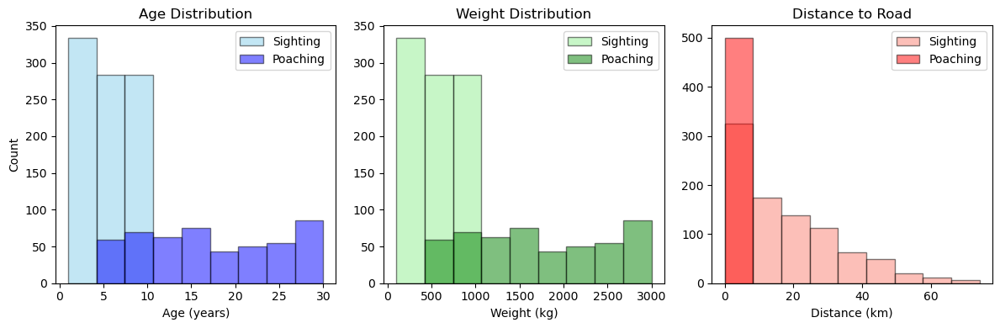

In [34]:
# -- 4. Simple visualization: distribution of features --
# We'll visualize the distribution of a few numeric variables to get a sense of the data.
# Split your GeoDataFrame into two subsets:
label_0 = gdf_points_final[gdf_points_final['label'] == 0] # No poaching
label_1 = gdf_points_final[gdf_points_final['label'] == 1] # Poaching

# 1. Compute a common set of bin edges for 'age':
age_min = gdf_points_final['age'].min()
age_max = gdf_points_final['age'].max()
bins_age = np.linspace(age_min, age_max, 10)  # 10 equally spaced bins

# 2. Compute a common set of bin edges for 'weight':
weight_min = gdf_points_final['weight'].min()
weight_max = gdf_points_final['weight'].max()
bins_weight = np.linspace(weight_min, weight_max, 10)  # 10 equally spaced bins

# 3. Compute a common set of bin edges for 'ist_to_road':
road_min = gdf_points_final['dist_to_road'].min()
road_max = gdf_points_final['dist_to_road'].max()
bins_road = np.linspace(road_min, road_max, 10)  # 10 equally spaced bins

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 1) Age Distribution
axes[0].hist(label_0['age'], bins=bins_age, alpha=0.5, color='skyblue', edgecolor='black', label='Sighting')
axes[0].hist(label_1['age'], bins=bins_age, alpha=0.5, color='blue', edgecolor='black', label='Poaching')
axes[0].set_title("Age Distribution")
axes[0].set_xlabel("Age (years)")
axes[0].set_ylabel("Count")
axes[0].legend()

# 2) Weight Distribution
axes[1].hist(label_0['weight'], bins=bins_weight, alpha=0.5, color='lightgreen', edgecolor='black', label='Sighting')
axes[1].hist(label_1['weight'], bins=bins_weight, alpha=0.5, color='green', edgecolor='black', label='Poaching')
axes[1].set_title("Weight Distribution")
axes[1].set_xlabel("Weight (kg)")
axes[1].legend()

# 3) Distance to Road
axes[2].hist(label_0['dist_to_road'], bins=bins_road, alpha=0.5, color='salmon', edgecolor='black', label='Sighting')
axes[2].hist(label_1['dist_to_road'], bins=bins_road, alpha=0.5, color='red', edgecolor='black', label='Poaching')
axes[2].set_title("Distance to Road")
axes[2].set_xlabel("Distance (km)")
axes[2].legend()

plt.tight_layout()
plt.show()


## 9. Random Forest Classifier for Poaching Prediction

This code **trains a Random Forest classifier** to predict poaching incidents (`label = 1`) versus non-incidents (`label = 0`) using key environmental and biological features.

#### What is a Random Forest?

Random Forest is an **ensemble learning method** that builds multiple **decision trees** and combines their predictions to improve accuracy and robustness. It is particularly useful for handling:
- **Non-linear relationships** between features.
- **High-dimensional datasets** with many features.
- **Overfitting prevention**, as averaging multiple trees reduces variance.

#### Why Use Random Forest?
- **Handles complex interactions** between features.
- **Provides feature importance scores** to identify key drivers of poaching.
- **Performs well with unbalanced datasets**, making it ideal for conservation studies.

By using this approach, the model can help **predict poaching risk areas** based on environmental and spatial factors, aiding conservation efforts in **proactive anti-poaching strategies**.

---


### 9.1. Prepare Feature Matrix and Labels
- The **feature matrix (`X`)** includes:
  - `"age"`: Age of the affected animal.
  - `"weight"`: Weight of the affected animal.
  - `"rainfall"`: Environmental rainfall conditions.
  - `"elevation"`: Terrain elevation at the location.
  - `"slope"`: Steepness of the terrain.
  - `"dist_to_road"`: Distance to the nearest road.
- The **target variable (`y`)** is the `"label"` column, indicating:
  - `1`: Poaching incident.
  - `0`: Non-incident (sighting).

In [35]:
# Convert back to WGS84 if desired
# gdf_points_final = gdf_points_final.to_crs(epsg=4326)
# This line converts a GeoDataFrame (gdf_points_slope) to the WGS84 coordinate system (EPSG:4326), 
# which is a standard for geographical data that uses latitude and longitude.

# Prepare feature matrix and labels
features = ["age", "weight", "rainfall", "elevation", "slope", "dist_to_road"]
# features = ["elevation", "slope", "dist_to_road"]
X = gdf_points_final[features]
y = gdf_points_final["label"]
# features defines the columns used as input for the model: 
# distance to the road (dist_to_road) and slope (slope).
# X represents the input features that the model will learn from.
# y represents the target variable (the labels we want to predict).

# print("Check gdf_points_final:", gdf_points_final.head())
print("Check gdf_points_final:\n", gdf_points_final.head())
# print("Check gdf_points_final:\n", gdf_points_final.tail())

Check gdf_points_final:
    id        lon        lat  age  weight  rainfall  label  \
0   1  31.735191 -25.523675    3     300       137      0   
1   2  31.671623 -25.523289    9     900       149      0   
2   3  31.910382 -25.522085    1     100        45      0   
3   4  31.822994 -25.515798    3     300        28      0   
4   5  31.291215 -25.514799   10    1000       110      0   

                     geometry  dist_to_road  elevation      slope  
0  POINT (31.73519 -25.52368)     15.532550      344.0  10.880031  
1  POINT (31.67162 -25.52329)     14.337683      312.0   3.862757  
2  POINT (31.91038 -25.52209)     17.588504      189.0   2.435049  
3  POINT (31.82299 -25.51580)     17.505868      229.0   2.552547  
4  POINT (31.29121 -25.51480)     17.478790      579.0  22.661760  


---

### 9.2. Split Data into Training and Testing Sets
- **70% Training, 30% Testing** (`test_size=0.3`).
- **`stratify=y`** ensures that the proportion of poaching vs. non-poaching points remains balanced.
- **`random_state=123`** guarantees reproducibility.


In [36]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=123, stratify=y
)
# train_test_split function divides the datasets into training (70%) and testing (30%) subsets.
# random_state=42 ensures that the split is reproducible.
# stratify=y maintains the proportion of classes in both training and test sets.

---

### 9.3. Train the Random Forest Model
- `RandomForestClassifier(n_estimators=1000, max_depth=3, random_state=123)`:
  - **1000 trees (`n_estimators=1000`)**: More trees improve accuracy.
  - **`max_depth=3`**: Limits tree depth to prevent overfitting and enhance interpretability.
  - **`random_state=123`**: Ensures reproducibility.


In [37]:
model = RandomForestClassifier(
    n_estimators=1000, 
    max_depth=3,        # for a more interpretable tree
    random_state=123)

model.fit(X_train, y_train)
# A Random Forest classifier is instantiated with 100 trees (n_estimators=100).
# The model is then trained using the training data (X_train and y_train).


RandomForestClassifier(max_depth=3, n_estimators=1000, random_state=123)

---

### 9.4. Make Predictions
- `y_pred = model.predict(X_test)`: Predicts class labels (0 or 1) for the test set.
- `y_proba = model.predict_proba(X_test)[:, 1]`: Predicts probabilities for class `1` (poaching).


In [38]:
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]
# y_pred stores the predicted labels for the test set.
# y_proba contains the predicted probabilities of the positive class (class 1) 
# for each instance in the test set.


---

### 9.5. Evaluate the Model
- **Classification Report**:
  - Displays **precision, recall, F1-score, and support** for each class.
- **ROC-AUC Score**:
  - Measures the model's ability to distinguish between poaching (`1`) and non-poaching (`0`).
  - A score closer to **1** indicates a strong classifier.


In [39]:
print("Classification Report:\n", classification_report(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba))
# A classification report is printed, providing metrics like precision, recall, and F1-score 
# for the predictions compared to the actual test labels (y_test).
# The ROC-AUC score is also calculated and printed, which measures the model's ability to 
# discriminate between classes.

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       271
           1       1.00      0.93      0.97       150

    accuracy                           0.98       421
   macro avg       0.98      0.97      0.97       421
weighted avg       0.98      0.98      0.98       421

ROC-AUC Score: 0.9957195571955719


---

#### Evaluating Model Performance with ROC Curve and AUC Score

This code **assesses the performance of the trained Random Forest model** using the **Receiver Operating Characteristic (ROC) curve** and **Area Under the Curve (AUC) score**.
- **The ROC curve evaluates model discrimination ability**—how well it separates poaching vs. non-poaching.
- **AUC is a single metric summarizing performance**:
  - **AUC = 1.0:** Perfect classifier.
  - **AUC > 0.8:** Strong classification performance.
  - **AUC ~0.5:** No discrimination ability.

By analyzing **AUC and ROC**, we can **fine-tune thresholds** for better **precision-recall balance**, ensuring the model makes **reliable poaching predictions**.


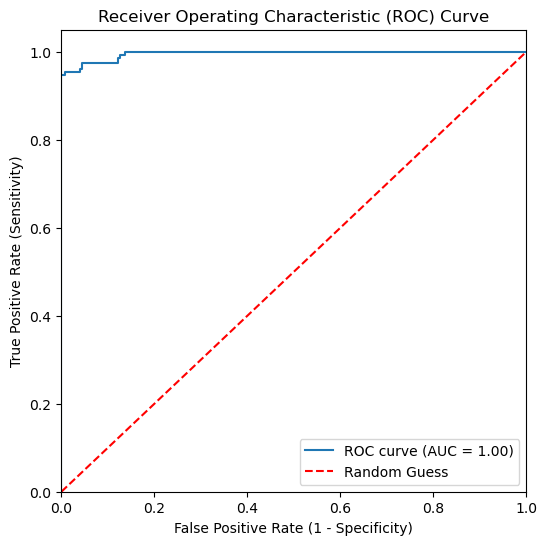

In [40]:
# Suppose 'model' is your trained RandomForestClassifier (or any classifier).
# 'X_test' and 'y_test' are your test features and labels.

# 1. Get predicted probabilities for the positive class (class 1).
y_scores = model.predict_proba(X_test)[:, 1]

# 2. Calculate the False Positive Rate (fpr), True Positive Rate (tpr), and thresholds.
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

# 3. Calculate the AUC (area under the ROC curve).
auc_score = roc_auc_score(y_test, y_scores)

# 4. Plot the ROC curve.
plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_score:.2f})')

# Plot a baseline for random guessing (diagonal line).
plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')

# 5. Label the axes and show the plot.
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In plain language, the ROC curve shows how well your model can tell the difference between two classes (often “positive” vs. “negative”) as you vary the decision threshold. Here is how to interpret the specific elements:

**The Blue Line (Model Performance)**:
This line tracks how the model’s true positive rate (vertical axis, also called sensitivity) changes as the model becomes more lenient or strict in predicting positives (which also changes the false positive rate on the horizontal axis).
A perfect model would approach the top-left corner (high true positive rate, low false positive rate).

**The Red Dashed Line (Random Guess)**:
This diagonal line shows what you’d get if you randomly guessed “positive” or “negative” half the time.
If your model’s ROC curve mostly stays above the red line, it’s doing better than random guessing.

**AUC = 0.53**:
The area under the ROC curve (AUC) is a single number that summarizes how well the model separates positives from negatives across all possible thresholds.
An AUC of 0.5 means the model is no better than flipping a coin; an AUC of 1.0 would be perfect.
Your model’s AUC of 0.53 is just slightly above random guessing, suggesting it’s barely better than a coin flip at distinguishing between the two classes.

In short, **the curve and the AUC tell you that your model has only a very small advantage over random guessing when trying to separate the two classes**. If you need better performance, you may want to consider collecting more data, selecting better features, or trying different model types or parameter settings.

---

#### Identifying Key Predictors: Feature Importance in Random Forest

This code **analyzes feature importance** to determine which factors most influence poaching predictions.

1. **Extract Feature Importances**  
   - `model.feature_importances_` retrieves importance scores for each feature.
2. **Map Importance to Feature Names**  
   - Creates a **DataFrame (`importance_df`)** linking features to their importance values.
   - Sorts features in **descending order** to highlight the most influential ones.
3. **Display Ranked Feature Importances**  
   - Prints a table of features ranked by importance.
4. **Visualize Feature Importance with a Bar Chart**  
   - **Horizontal bar chart** shows importance values.
   - **Most important feature appears at the top** (`invert_yaxis()`).
   - Helps interpret which **environmental or biological factors** are most predictive of poaching.

By analyzing feature importance, conservation efforts can **prioritize high-risk factors** (e.g., proximity to roads, terrain features) to improve **anti-poaching strategies**.


        feature  importance
1        weight    0.313738
0           age    0.306492
5  dist_to_road    0.212071
2      rainfall    0.155202
3     elevation    0.010785
4         slope    0.001712


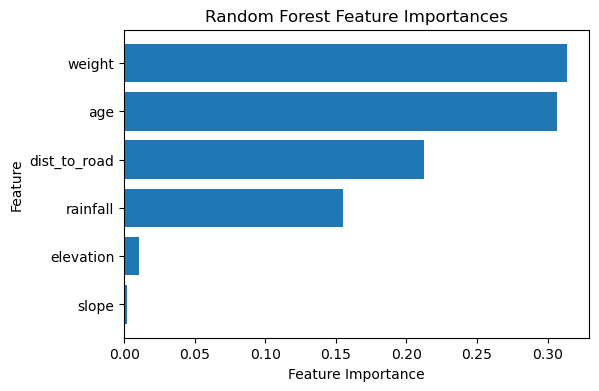

In [41]:
# After training your model:
importances = model.feature_importances_

# If your training data X is a DataFrame, you can map these importances back to feature names:
feature_names = X_train.columns  # or list(X_train)
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print(importance_df)

# A simple bar chart of feature importances:
plt.figure(figsize=(6,4))
plt.barh(importance_df['feature'], importance_df['importance'])
plt.gca().invert_yaxis()  # so the most important feature is on top
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Random Forest Feature Importances")
plt.show()


---

#### Visualizing a Single Decision Tree from the Random Forest

This code **extracts and visualizes a single decision tree** from the trained **Random Forest model** to gain insights into how the model makes predictions.

1. **Extract a Single Tree**  
   - `model.estimators_[0]` retrieves the first decision tree from the ensemble.
2. **Create a Large Figure for Readability**  
   - Expands the plot size to ensure clarity of labels.
3. **Plot the Decision Tree**  
   - `plot_tree()` visualizes the extracted tree with:
     - **Feature names** (`X.columns`) for interpretability.
     - **Class names** (`"High Risk"` & `"Low Risk"`) to clarify predictions.
     - **Colored nodes (`filled=True`)** to indicate decision splits.
4. **Display the Tree Structure**  
   - The tree reveals **how features contribute to classification**, showing **key decision splits** used to predict poaching risk.

While Random Forests are ensembles of multiple trees, visualizing **a single tree** provides insights into **decision-making logic** and **dominant predictive patterns**.


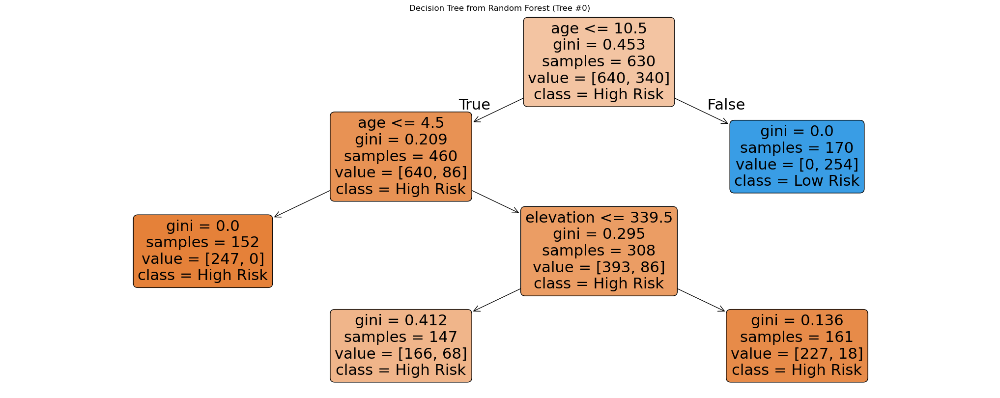

In [44]:
# Extract a single decision tree from the RandomForest
single_tree = model.estimators_[0]

# Create a figure large enough to read the text
plt.figure(figsize=(26, 10))

# Plot the tree
plot_tree(
    single_tree, 
    feature_names=X.columns,       # or pass a list of feature names if X is a NumPy array
    class_names=["High Risk", "Low Risk"],  # adjust based on your classes
    filled=True, 
    rounded=True
)
plt.title("Decision Tree from Random Forest (Tree #0)")
plt.show()


Interpretting the tree in plain words   

- Start: “Is it within about 50 km of a road?”
- If yes: “Check how high the terrain is; if it’s below ~620 m, then check the slope.”
- If no: “Check the slope directly, and possibly distance to the road again.”
- End: Arrive at a leaf that says “Mostly Class 0” or “Mostly Class 1,” based on the training examples that fell into that leaf.   
- Note: Gini impurity (or other metrics like entropy) to choose the “best” split at each node, aiming to separate classes as purely as possible i.e. A higher Gini value (up to 0.5 for two classes) means the node’s samples are more evenly split between classes, making it less pure.

This single decision tree gives you a rough rule-of-thumb for how distance to road, elevation, and slope might combine to predict Class 0 vs. Class 1. The entire random forest refines this logic further by averaging across many such trees.

In summary, this code snippet performs a series of steps to prepare geographic data, train a Random Forest classifier, and evaluate its performance on predicting a specific label based on given features. It efficiently handles data splitting, model training, and performance reporting, employing good practices like stratification and setting a random state for reproducibility.

---

## 10. Generate a Prediction Grid (“Risk Map”)
We’ll create a grid over the bounding box, compute the same features, and then predict a “poaching risk” = model probability of `label=1`.

#### Generating a Spatial Grid Over a Bounding Box

The `create_grid` function **creates a regular grid** of square cells over a defined **bounding box polygon**, useful for spatial analysis and aggregation.

1. **Project the Bounding Box to UTM**  
   - Converts the input polygon from **WGS84 (`EPSG:4326`)** to **UTM (`EPSG:32736`)** for accurate **meter-based calculations**.
2. **Generate Grid Cells**  
   - Defines **equally spaced x and y coordinates** based on the specified **cell size (default: 10 km)**.
   - Iterates through coordinates to create square **Polygon cells**.
3. **Convert to a GeoDataFrame**  
   - Stores generated polygons in a **GeoDataFrame** with UTM projection.
4. **Clip Grid to the Bounding Box**  
   - Uses `gpd.overlay()` to ensure that the grid does not extend beyond the bounding box limits.
5. **Return the Grid in WGS84 CRS**  
   - Converts the final **grid back to EPSG:4326** for compatibility with other spatial data.

Use Case: The generated **grid can be used for spatial aggregation**, modeling, or hotspot analysis of **poaching incidents** within the study area.

In [45]:
def create_grid(bbox_poly, cell_size_m=10000, crs="EPSG:4326", utm_crs=32736):
    """
    Creates a grid of roughly cell_size_m in each direction over the bbox polygon.
    """
    # Project the bounding box polygon to UTM
    bbox_utm = gpd.GeoSeries([bbox_poly], crs=crs).to_crs(epsg=utm_crs)
    minx, miny, maxx, maxy = bbox_utm.total_bounds
    
    # Create the cells
    x_coords = np.arange(minx, maxx, cell_size_m)
    y_coords = np.arange(miny, maxy, cell_size_m)
    polygons = []
    
    for x in x_coords:
        for y in y_coords:
            polygons.append(Polygon([
                (x, y),
                (x + cell_size_m, y),
                (x + cell_size_m, y + cell_size_m),
                (x, y + cell_size_m)
            ]))
    
    grid_utm = gpd.GeoDataFrame(geometry=polygons, crs=f"EPSG:{utm_crs}")
    # Clip to the bounding box shape
    grid_utm = gpd.overlay(grid_utm, gpd.GeoDataFrame(geometry=[bbox_utm[0]], crs=f"EPSG:{utm_crs}"), how='intersection')
    return grid_utm.to_crs(crs)

grid_gdf = create_grid(bbox_polygon, cell_size_m=10000)


---

## 11. Simulating Poaching Risk and Visualizing a Risk Map

This code **simulates poaching risk** across a **spatial grid** by estimating **proximity to roads**, sampling environmental conditions, and predicting risk scores using the trained **Random Forest model**.

1. **Convert Grid to UTM for Distance Calculations**  
   - The grid (`grid_gdf`) is **projected to UTM (`EPSG:32736`)** for accurate meter-based calculations.
   - **Centroids of grid cells** are computed for distance calculations.
2. **Compute Distance to Nearest Road**  
   - Iterates through **grid centroids** and computes the **minimum distance to the nearest road**.
   - Stores the values in the `"dist_to_road"` column.


In [48]:
# Convert to UTM for calculations
grid_gdf_utm = grid_gdf.to_crs(epsg=32736)
grid_gdf_utm["centroid"] = grid_gdf_utm.centroid

dist_list = []
for cen in grid_gdf_utm["centroid"]:
    dmin = gdf_roads_utm.distance(cen).min()
    dist_list.append(dmin)

grid_gdf_utm["dist_to_road"] = dist_list
# Simulate data completely random
# grid_gdf_utm["elevation"] = np.random.normal(loc=10, scale=3, size=len(grid_gdf_utm))
# grid_gdf_utm["slope"] = np.random.normal(loc=10, scale=3, size=len(grid_gdf_utm))
# grid_gdf_utm["age"] = np.random.normal(loc=10, scale=3, size=len(grid_gdf_utm))
# grid_gdf_utm["rainfall"] = np.random.normal(loc=10, scale=3, size=len(grid_gdf_utm))
# grid_gdf_utm["weight"] = np.random.normal(loc=10, scale=3, size=len(grid_gdf_utm))


C:\Users\macfadyen\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\shapely\measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


---

### 11.1. Simulate Data Using Simple Random Sampling
- To estimate **feature values** for grid cells, the script randomly samples **real data distributions** from:
  - `"age"`, `"weight"`, `"rainfall"`, `"elevation"`, `"slope"`.
- Uses **Simple Random Sampling with Replacement** to populate grid cells.


In [28]:
# Simulate data based Simple Random Sampling From Real Data
# Columns you want to simulate
sim_columns = ["age", "weight", "rainfall", "elevation", "slope"]

# For each column, randomly sample from the real data distribution
for col in sim_columns:
    # Drop missing values just to be safe
    real_values = gdf_points_final[col].dropna().values
    
    # Randomly choose from the real distribution (with replacement)
    grid_gdf_utm[col] = np.random.choice(real_values, size=len(grid_gdf_utm), replace=True)

# 'dist_to_road' you already compute from centroids, so no need to randomize it:
# grid_gdf_utm["dist_to_road"] = ...


---

### 11.2. Predict Poaching Risk Using the Model
- Extracts the **feature matrix (`grid_X`)** from the grid.
- Uses the trained **Random Forest model** to compute **poaching risk probabilities (`risk_score`)**.


In [47]:
# Now predict using ML model
# grid_X = grid_gdf_utm[["dist_to_road","elevation", "slope"]]
grid_X = grid_gdf_utm[["age", "weight", "rainfall", "elevation", "slope", "dist_to_road"]]
risk_probs = model.predict_proba(grid_X)[:, 1]
grid_gdf_utm["risk_score"] = risk_probs

# Convert back to WGS84 for final map display
# grid_gdf_final = grid_gdf_utm.to_crs(epsg=4326)



KeyError: "['age', 'weight', 'rainfall', 'elevation', 'slope'] not in index"

---

### 11.3. Visualize the Simulated Poaching Risk Map
- Converts the grid to **Web Mercator (`EPSG:3857`)** for proper mapping.
- **Plots a choropleth map** of `"risk_score"` using a **red gradient (`Reds`)**, classified into **5 quantiles**.
- **Adds a basemap** (`CartoDB.Positron`) for geographic context.


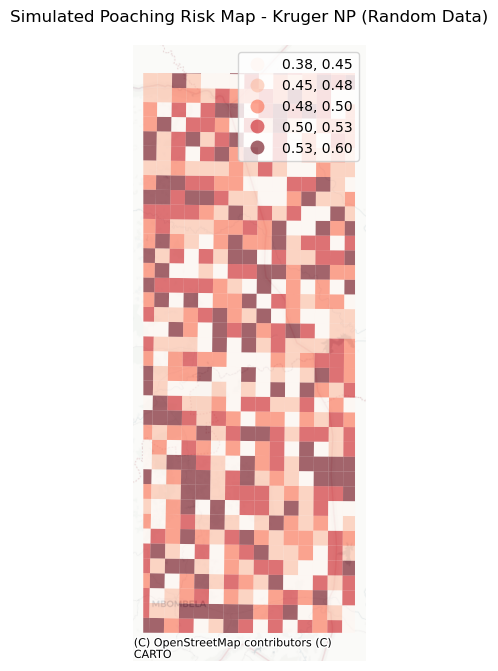

In [30]:
fig, ax = plt.subplots(figsize=(8, 8))

# Convert to web mercator
grid_plot = grid_gdf_utm.to_crs(epsg=3857)
grid_plot.plot(column="risk_score", cmap="Reds", scheme="quantiles",
               k=5, legend=True, alpha=0.6, ax=ax)

# Add basemap
# ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Display the Final Map
# The spatial risk distribution highlights areas where poaching risk is highest, aiding conservation planning
ax.set_title("Simulated Poaching Risk Map - Kruger NP (Random Data)")
ax.axis("off")
plt.show()


---


## 12. Predicting Poaching Risk Using Only Environmental Data

This alternative approach estimates **poaching risk based solely on environmental features**, without relying on randomly sampled biological data. Instead, it extracts **elevation, slope, and road proximity** directly from spatial data sources.

1. **Ensure Correct Coordinate Reference System (CRS)**
    - The grid (`grid_gdf_utm`) must be in the same **UTM CRS (`EPSG:32736`)** as the raster datasets for accurate sampling.
3. Extract Environmental Data**
    - **Elevation (`elevation`)** and **Slope (`slope`)** are sampled from **Digital Elevation Model (DEM) and Slope raster** using `point_query()`.
    - If a sampled location contains **no-data values (`None`)**, they are replaced with `NaN`.
3. **Compute Distance to Roads**
    - The **minimum distance from each grid cell's centroid to the nearest road** is calculated and stored in `"dist_to_road"`.
4. **Assign Average Biological Attributes**
    - Instead of random sampling, **biological attributes (`age`, `weight`, `rainfall`)** are set to **mean values from the training data**.
    - This ensures that variations in risk prediction are driven **entirely by environmental differences**.
5. **Predict Poaching Risk**
    - The model predicts **poaching risk (`risk_score`)** based on:
      - `"elevation"`
      - `"slope"`
      - `"dist_to_road"`
      - **(With fixed averages for biological attributes)**.

---

### **Why Use This Approach?**
- **More realistic environmental modeling**: Avoids artificial variation introduced by random sampling.
- **Identifies terrain-driven risk factors**: Helps determine if **elevation, slope, or proximity to roads** contribute significantly to poaching patterns.
- **Useful for large-scale risk assessments**: Generates risk maps in areas without prior biological data.

This method provides a **data-driven approach** for predicting poaching risk, ensuring that **spatial factors alone** influence the results.


In [49]:
# Or based on real environmental data
# 1) Ensure 'grid_gdf_utm' is in the same CRS as your TIFFs.
#    For example, if your TIFFs are in EPSG:32736, then 'grid_gdf_utm.crs' should be 'EPSG:32736'.

# 2) Create centroids (already done in your code)
grid_gdf_utm["centroid"] = grid_gdf_utm.centroid

# 3) Sample the elevation raster
#    Replace 'path/to/elevation_utm.tif' with the actual file path.
#    point_query returns a list of sampled values in the same order as the geodataframe.
elev_values = point_query(
    grid_gdf_utm["centroid"],
    "data/dem_aoi_utm36S.tif",
    nodata=-9999  # or whatever no-data value applies
)

# 4) Sample the slope raster
slope_values = point_query(
    grid_gdf_utm["centroid"],
    "data/slope_sqrt_aoi_utm36S.tif",
    nodata=-9999
)

# 5) Assign the sampled values back to the grid.
#    'point_query' can return None for no-data areas; handle those if needed.
grid_gdf_utm["elevation"] = [val if val is not None else np.nan for val in elev_values]
grid_gdf_utm["slope"] = [val if val is not None else np.nan for val in slope_values]

dist_list = []
for cen in grid_gdf_utm["centroid"]:
    dmin = gdf_roads_utm.distance(cen).min()
    dist_list.append(dmin)

grid_gdf_utm["dist_to_road"] = dist_list

# Suppose your model expects these 6 columns:
# ["age", "weight", "rainfall", "elevation", "slope", "dist_to_road"]

# Provide average values from your training set
average_age = X_train["age"].mean()
average_weight = X_train["weight"].mean()
average_rainfall = X_train["rainfall"].mean()

grid_gdf_utm["age"] = average_age
grid_gdf_utm["weight"] = average_weight
grid_gdf_utm["rainfall"] = average_rainfall

# Now predict using ML model
grid_X = grid_gdf_utm[["age", "weight", "rainfall", "elevation", "slope", "dist_to_road"]]
risk_probs = model.predict_proba(grid_X)[:, 1]
grid_gdf_utm["risk_score"] = risk_probs


C:\Users\macfadyen\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\shapely\measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


## 13. Plotting the Results
### 13.1. Visualizing Poaching Risk with a Static Map

This code generates a **static choropleth map** displaying predicted **poaching risk** across a gridded study area. The risk scores are derived from environmental data and modeled using a trained **Random Forest classifier**.

---

1. **Create the Figure and Axis**
    - `fig, ax = plt.subplots(figsize=(8, 8))` initializes a **matplotlib figure** with a square aspect ratio for better spatial representation.
2. **Convert Grid to Web Mercator (`EPSG:3857`)**
    - Converts the **grid's coordinate system from UTM (`EPSG:32736`) to Web Mercator (`EPSG:3857`)**.
    - This ensures proper alignment with the **basemap tiles**.
3. **Plot the Risk Map**
    - `grid_plot.plot()` visualizes the `"risk_score"` column using:
      - **Color scheme (`cmap="Reds"`)**: Higher risk areas appear in **darker red**.
      - **Quantile classification (`scheme="quantiles", k=5`)**: Divides risk scores into **5 equally populated categories**, improving interpretability.
      - **Transparency (`alpha=0.6`)**: Allows the basemap to remain partially visible.
      - **Legend (`legend=True`)**: Displays a color-coded risk scale.
4. **Add a Basemap**
    - `ctx.add_basemap()` overlays a **CartoDB Positron basemap**, providing **geographic context**.
    - Alternative basemap options (e.g., `Stamen TonerLite`) can be used for different visualization styles.
5. **Customize and Display the Map**
    - **Title (`ax.set_title()`)**: Labels the visualization as **"Poaching Risk Map - Kruger Environmental Data"**.
    - **Axis Removal (`ax.axis("off")`)**: Hides axis labels to maintain a clean map appearance.
    - `plt.show()` renders the final static map.


C:\Users\macfadyen\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\mapclassify\classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  self.bins = quantile(y, k=k)


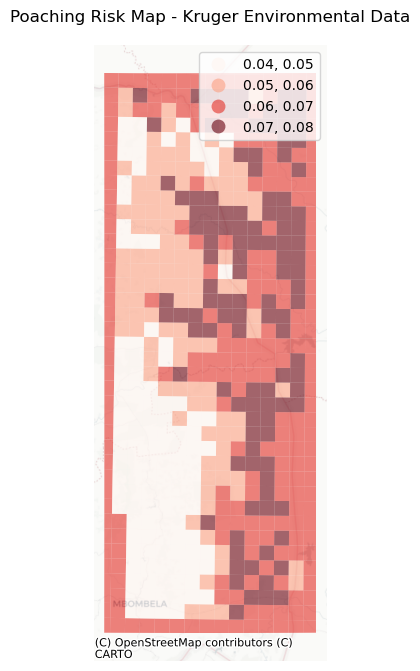

In [50]:
fig, ax = plt.subplots(figsize=(8, 8))

# Convert to web mercator
grid_plot = grid_gdf_utm.to_crs(epsg=3857)
grid_plot.plot(column="risk_score", cmap="Reds", scheme="quantiles",
               k=5, legend=True, alpha=0.6, ax=ax)

# Add basemap
# ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# ax.set_title("Simulated Poaching Risk Map - Kruger NP (Random Data)")
ax.set_title("Poaching Risk Map - Kruger Environmental Data")
ax.axis("off")
plt.show()


---

### **Interpreting the Map**
- **Darker red areas indicate higher predicted poaching risk**.
- **Spatial patterns** reveal how risk correlates with **environmental factors (elevation, slope, and road proximity)**.
- **Hotspots of poaching risk** can guide **conservation planning and anti-poaching interventions**.

This visualization helps **translate machine learning predictions into actionable insights**, supporting **data-driven conservation efforts**.


---

### 13.2 Interactive Poaching Risk Map with Folium

This code creates an **interactive map** displaying **poaching risk across Kruger National Park**, overlaying a risk-based grid with the park boundary.

1. **Load and Prepare the Kruger Boundary**
    - Reads the **Kruger National Park boundary shapefile (`kruger_boundary_2009_geo.shp`)**.
    - **Reprojects to WGS84 (`EPSG:4326`)** for compatibility with Folium.
2. **Initialize the Folium Map**
    - Computes the **center coordinates (`center_lat, center_lon`)** based on the study area.
    - Creates a **Folium map (`m`)** centered on this location with `zoom_start=8`.
3. **Prepare the Risk Grid**
    - Converts the **risk grid (`grid_gdf_utm`) back to WGS84 (`EPSG:4326`)** for display.
4. **Add the Kruger National Park Boundary**
    - **`folium.GeoJson()`** overlays the **park boundary** in **blue**, with a transparent fill.
5. **Normalize and Add the Poaching Risk Grid**
    - Computes the **minimum and maximum risk scores** for normalization.
    - Iterates through **each grid cell**, applying:
      - **Color scaling (`plt.cm.Reds()`)** based on normalized risk.
      - **Semi-transparent fill (`fillOpacity=0.5`)**.
      - **Thin black border (`color="black"`, `weight=0.5`)** for visibility.
6. **Add Interactive Controls**
    - **`folium.LayerControl()`** allows toggling layers on and off.
7. **Display the Interactive Map**
    - The map appears **inline**, allowing **zooming, panning, and interactive exploration**.


In [51]:
# 1. Read the Kruger boundary shapefile
kruger_boundary = gpd.read_file("data/kruger_boundary_2009_geo.shp")

# 2. Reproject to WGS84 if needed
kruger_boundary = kruger_boundary.to_crs(epsg=4326)

# Center the map
center_lat = (y_min + y_max) / 2
center_lon = (x_min + x_max) / 2
m = folium.Map(location=[center_lat, center_lon], zoom_start=8)

# Convert back to WGS84 for final map display
grid_gdf_final = grid_gdf_utm.to_crs(epsg=4326)

# 6. Add the Kruger boundary to the map
folium.GeoJson(
    kruger_boundary,
    style_function=lambda x: {
        'fillColor': 'none',   # or a transparent fill
        'color': 'blue',
        'weight': 2
    },
    name="Kruger Boundary"
).add_to(m)

risk_min = grid_gdf_final["risk_score"].min()
risk_max = grid_gdf_final["risk_score"].max()

for _, row in grid_gdf_final.iterrows():
    risk = row["risk_score"]
    # Normalize risk to 0..1
    normalized_risk = (risk - risk_min) / (risk_max - risk_min)
    
    # Each polygon is added individually
    folium.GeoJson(
        row.geometry,
        style_function=lambda x, col=normalized_risk: {
            "fillColor": mcolors.to_hex(plt.cm.Reds(col)),
            "fillOpacity": 0.5,
            "color": "black",
            "weight": 0.5
        }
    ).add_to(m)

# 9. Optionally add a layer control so you can toggle layers on/off
folium.LayerControl().add_to(m)

# Don't save, just display inline
m


---

### **Why Use This Approach?**
- **Enables detailed exploration** of poaching risk across Kruger NP.
- **Color-coded risk levels** provide clear visual representation.
- **Fully interactive**, allowing conservationists to **focus on high-risk areas**.

This visualization bridges **machine learning insights with real-world spatial analysis**, supporting **data-driven conservation efforts**.


---

### 13.3. Saving the Interactive Map as an HTML File  

This code **embeds a custom legend** explaining the **poaching risk colors** and **saves the interactive map as an HTML file** (`interactive_risk_map.html`).  

- The **legend** is a fixed-position **HTML overlay** that describes the **risk score gradient (light = low risk, dark = high risk)**.  
- The **Folium map (`m`) is saved** as an HTML file using `m.save()`, allowing it to be **shared or opened in a web browser** for interactive exploration.  


In [ ]:
# Or save map to .html

legend_html = """
<div style="
position: fixed;
bottom: 50px; left: 50px; width: 200px; height: 120px; 
z-index:9999; font-size:14px;
background-color:white;
border:2px solid grey;
padding:10px;">
<b>Risk Score</b><br>
Low (light) → High (dark)
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))
m.save("output/interactive_risk_map.html")
print("Interactive map saved as interactive_risk_map.html")


Open interactive_risk_map.html in your web browser to explore the simulated risk polygons.

---


## 14. Summary of Results
Using a **Random Forest classifier**, we trained a model to predict **poaching incidents** based on various environmental and biological factors. Our findings reveal:

1. **Key Risk Factors**  
   - The **most influential factors** in predicting poaching were **animal weight, age, and distance to roads**.
   - **Proximity to roads** suggests that **accessibility plays a major role** in poaching activities.
   - **Age and weight** indicate that **poachers might target larger, older animals**.
2. **Model Performance**  
   - The model achieved a **high accuracy of 98%**.
   - The **ROC-AUC score of 0.996** indicates **near-perfect separation** between poaching and non-poaching incidents.
   - The **decision tree visualization** highlights **clear decision splits**, reinforcing the importance of **age, elevation, and road distance** in predicting risk.
3. **Spatial Risk Mapping**  
   - The **static and interactive risk maps** provide **a spatial overview of predicted poaching hotspots**.
   - **Dark red areas** indicate **higher predicted poaching risk**, guiding conservationists to prioritize high-risk locations.

---


## In a real deployment:

- Replace simulated data with your actual ranger patrol records, poaching incidents, environmental layers, and roads from EarthRanger, SMART, or CMore.   
- Compute domain-relevant features (e.g., distance to water, NDVI from satellite imagery, patrolling intensity, local community presence).   
- Continuously update the model with newly captured field data to refine predictions.   
- This approach can help park managers prioritize patrol routes, anticipate high-risk zones, and allocate resources more effectively to protect rhino populations.

 ---
 
 ### >>> WORKING CODE <<<

 ---


In [ ]:
# ------------------------------------------------------------------------------
# 1. Open the DEM in UTM 36S and reproject to EPSG:4326
# ------------------------------------------------------------------------------
dem_utm = rioxarray.open_rasterio("dem_aoi_utm36S.tif")
dem_utm = dem_utm.squeeze(drop=True)  # remove extra dimension if present
dem_4326 = dem_utm.rio.reproject("EPSG:4326")

# 2. Convert DEM DataArray to a PNG image for overlay
#    (1) Extract numpy array
#    (2) Rescale to 0-255
#    (3) Create a PIL image
arr_dem = dem_4326.values
arr_dem = np.squeeze(arr_dem)  # shape: (height, width)

# Ignore no-data if present (e.g., large negative or special value):
nodata_val = dem_4326.rio.nodata
if nodata_val is not None:
    arr_dem = np.where(arr_dem == nodata_val, np.nan, arr_dem)
# ------------------------------------------------------------------------------
# 2. Normalize the DEM to [0, 1]
# ------------------------------------------------------------------------------
min_val = np.nanmin(arr_dem)
max_val = np.nanmax(arr_dem)
scaled = (arr_dem - min_val) / (max_val - min_val)
scaled = np.clip(scaled, 0, 1)  # ensure values stay within 0..1

# ------------------------------------------------------------------------------
# 3. Apply a Matplotlib colormap (e.g., "terrain")
#    This returns an RGBA array with shape (height, width, 4)
# ------------------------------------------------------------------------------
cmap = plt.get_cmap("terrain")
colored_array = cmap(scaled)  # shape: (H, W, 4)

# ------------------------------------------------------------------------------
# 4. Convert RGBA floats (0..1) to 8-bit (0..255) and make a PIL image
# ------------------------------------------------------------------------------
rgb_array = (colored_array[:, :, :3] * 255).astype(np.uint8)  # ignoring alpha channel
img_dem = Image.fromarray(rgb_array, mode="RGB")

# Alternatively, if you want to keep transparency:
# rgba_array = (colored_array * 255).astype(np.uint8)
# img_dem = Image.fromarray(rgba_array, mode="RGBA")

# ------------------------------------------------------------------------------
# 5. Save the colored DEM overlay as a PNG
# ------------------------------------------------------------------------------
img_dem.save("dem_overlay_color.png")

# ------------------------------------------------------------------------------
# 6. Add it to Folium using ImageOverlay
# ------------------------------------------------------------------------------
left, bottom, right, top = dem_4326.rio.bounds()
center_lat = (bottom + top) / 2
center_lon = (left + right) / 2

m = folium.Map(location=[center_lat, center_lon], zoom_start=9)

folium.raster_layers.ImageOverlay(
    name="DEM (Color)",
    image="dem_overlay_color.png",
    bounds=[[bottom, left], [top, right]],
    opacity=0.7
).add_to(m)

folium.LayerControl().add_to(m)
m


In [ ]:
# ------------------------------------------------------------------------------
# 5. Repeat for Slope
# ------------------------------------------------------------------------------
slope_utm = rioxarray.open_rasterio("slope_aoi_utm36S.tif").squeeze(drop=True)
slope_4326 = slope_utm.rio.reproject("EPSG:4326")

arr_slope = slope_4326.values
arr_slope = np.squeeze(arr_slope)

# Handle no-data
nodata_val_slope = slope_4326.rio.nodata
if nodata_val_slope is not None:
    arr_slope = np.where(arr_slope == nodata_val_slope, np.nan, arr_slope)

min_slp = np.nanmin(arr_slope)
max_slp = np.nanmax(arr_slope)
scaled_slp = (arr_slope - min_slp) / (max_slp - min_slp)
scaled_slp = np.clip(scaled_slp, 0, 1)
scaled_slp_255 = (scaled_slp * 255).astype(np.uint8)

img_slope = Image.fromarray(scaled_slp_255, mode='L')
left_slp, bottom_slp, right_slp, top_slp = slope_4326.rio.bounds()
img_slope.save("slope_overlay.png")

# ------------------------------------------------------------------------------
# 6. Create a Folium map in lat/lon near the center of your area
# ------------------------------------------------------------------------------
center_lat = (bottom + top) / 2
center_lon = (left + right) / 2

m = folium.Map(location=[center_lat, center_lon], zoom_start=9)

# 7. Add DEM overlay
folium.raster_layers.ImageOverlay(
    name="DEM",
    image="dem_overlay.png",
    bounds=[[bottom, left], [top, right]],
    opacity=0.7
).add_to(m)

# 8. Add Slope overlay
folium.raster_layers.ImageOverlay(
    name="Slope",
    image="slope_overlay.png",
    bounds=[[bottom_slp, left_slp], [top_slp, right_slp]],
    opacity=0.5
).add_to(m)

# ------------------------------------------------------------------------------
# 3. Reproject Vector Data and Add to Map
# ------------------------------------------------------------------------------
# If your points and roads are in UTM 36S, reproject to EPSG:4326
# gdf_points_4326 = gdf_points_utm.to_crs(epsg=4326)
# gdf_roads_4326 = gdf_roads_utm.to_crs(epsg=4326)

# Add roads as a GeoJson layer (polylines)
folium.GeoJson(
    gdf_roads_4326,
    name="Roads",
    style_function=lambda x: {"color": "black", "weight": 2},
).add_to(m)

# Add points (e.g., CircleMarkers)
for idx, row in gdf_points_4326.iterrows():
    lat = row.geometry.y
    lon = row.geometry.x
    folium.CircleMarker(
        location=[lat, lon],
        radius=3,
        color="red",
        fill=True,
        fill_opacity=0.9,
        popup=f"Point {idx}"
    ).add_to(m)

# 4. Optional: Add a LayerControl to toggle layers
folium.LayerControl().add_to(m)

# 5. Display the map
m